In [ ]:
!pip install torchinfo

In [ ]:
import os
import os.path as osp
import copy
import tensorflow as tf
import torch
import torch.nn as nn
import time
import numpy as np
import cv2
from PIL import Image
from tqdm import tqdm
import zipfile # Библиотека для работы с zip архивами
import os
import torch
from torch.utils.data.dataset import Dataset
#from torch import nn
from torch.utils.data.dataloader import DataLoader
from torchvision import transforms
from torchvision import models
from torchvision.utils import make_grid
from torchinfo import summary
import torchvision.transforms.functional as F

import albumentations
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

import random
import json

import polars as pl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.patches as mpatches
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

plt.style.use('ggplot')
pl.Config().set_tbl_rows(50)
pl.Config().set_tbl_cols(-1)
pl.Config().set_fmt_str_lengths(100)

def seed_everything(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    random.seed(seed)

seed_everything(42)

# 1 Задание

https://www.kaggle.com/competitions/cassava-leaf-disease-classification

## Загрузка данных

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
zip_file = '/content/drive/MyDrive/dataset.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall()
print(os.listdir())

In [ ]:
ROOT_DIR = '/content/cassava-leaf-disease-classification'
TRAIN_IMAGES_DIR = osp.join(ROOT_DIR, 'train_images')
train_df = pl.read_csv(os.path.join(ROOT_DIR, 'train.csv'))

# Create image paths
train_df = train_df.with_columns(
    path=pl.concat_str(pl.lit(f'{TRAIN_IMAGES_DIR}/'), pl.col('image_id'))
)

In [ ]:
with open("/content/cassava-leaf-disease-classification/label_num_to_disease_map.json", "r") as f:
    labelmap = json.load(f)
    labelmap = {int(k): v for k, v in labelmap.items()}

print(json.dumps(labelmap, indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


## Формируем датафреймы

In [ ]:
train_df = train_df.with_columns(
    is_exists=pl.col('path').map_elements(lambda x: osp.exists(x))
)

n_not_exists = train_df.filter(pl.col('is_exists') == False).shape[0]
assert n_not_exists == 0, print(f'There are {n_not_exists} non-exists files')

n_images = train_df.filter(pl.col('is_exists') == True).shape[0]
print(f'Total images: {n_images}')

train_df.head(5)

Total images: 21397


image_id,label,path,is_exists
str,i64,str,bool
"""1000015157.jpg""",0,"""/content/cassava-leaf-disease-classification/train_images/1000015157.jpg""",true
"""1000201771.jpg""",3,"""/content/cassava-leaf-disease-classification/train_images/1000201771.jpg""",true
"""100042118.jpg""",1,"""/content/cassava-leaf-disease-classification/train_images/100042118.jpg""",true
"""1000723321.jpg""",1,"""/content/cassava-leaf-disease-classification/train_images/1000723321.jpg""",true
"""1000812911.jpg""",3,"""/content/cassava-leaf-disease-classification/train_images/1000812911.jpg""",true


In [ ]:
val_size = 0.2
test_size = 0.2

val_split = n_images - int(n_images * (test_size + val_size))
test_split = n_images - int(n_images * test_size)

val_df = train_df[val_split:test_split]
test_df = train_df[test_split:]
train_df = train_df[:val_split]

n_train = len(train_df)
n_val = len(val_df)
n_test = len(test_df)

print('Splitted dataset:')
print(f'\t- Training set: {n_train}')
print(f'\t- Validation set: {n_val}')
print(f'\t- Testing set: {n_test}')

Splitted dataset:
	- Training set: 12839
	- Validation set: 4279
	- Testing set: 4279


## Аугментация изображений

In [ ]:
WIDTH = 512
HEIGHT = 512
NUM_CLASSES = 5
BATCH_SIZE = 32
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Device: {DEVICE}')

Device: cuda


In [ ]:
train_transforms = albumentations.Compose([
    albumentations.RandomResizedCrop(WIDTH, HEIGHT),
    albumentations.HorizontalFlip(p=0.5),
    albumentations.Transpose(p=0.5),
    albumentations.VerticalFlip(p=0.5),
    albumentations.ShiftScaleRotate(p=0.5),

    albumentations.HueSaturationValue(
      hue_shift_limit=0.2,
      sat_shift_limit=0.2,
      val_shift_limit=0.2,
      p=0.5
            ),

    albumentations.RandomBrightnessContrast(
      brightness_limit=(-0.1, 0.1),
      contrast_limit=(-0.1, 0.1),
      p=0.5
    ),

    albumentations.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()

])

test_transforms = albumentations.Compose([
    albumentations.CenterCrop(WIDTH, HEIGHT, p=1.0),
    albumentations.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

no_aug_train_transforms = albumentations.Compose([
    albumentations.CenterCrop(WIDTH, HEIGHT, p=1.0),
    albumentations.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()

])

no_aug_test_transforms = albumentations.Compose([
    albumentations.CenterCrop(WIDTH, HEIGHT, p=1.0),
    albumentations.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

Создаем кастомный датасет используя pytorch

In [ ]:
class CassavaDataset(Dataset):

    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):

        img = Image.open(self.df['path'][index])
        img = np.array(img)
        label = torch.tensor(self.df['label'][index], dtype=torch.long)

        if self.transform:
            return self.transform(image=img)['image'], label
        else:
            return img, label

In [ ]:
train_dataset = CassavaDataset(train_df, transform=train_transforms)
val_dataset = CassavaDataset(val_df, transform=test_transforms)
test_dataset = CassavaDataset(test_df, transform=test_transforms)

train_dl = DataLoader(train_dataset, BATCH_SIZE, shuffle=True)
val_dl = DataLoader(val_dataset, BATCH_SIZE, shuffle=True)
test_dl = DataLoader(test_dataset, BATCH_SIZE, shuffle=True)

In [ ]:
no_aug_train_dataset = CassavaDataset(train_df, transform=no_aug_train_transforms)
no_aug_val_dataset = CassavaDataset(val_df, transform=no_aug_test_transforms)
no_aug_test_dataset = CassavaDataset(test_df, transform=no_aug_test_transforms)

no_aug_train_dl = DataLoader(no_aug_train_dataset, BATCH_SIZE, shuffle=True)
no_aug_val_dl = DataLoader(no_aug_val_dataset, BATCH_SIZE, shuffle=True)
no_aug_test_dl = DataLoader(no_aug_test_dataset, BATCH_SIZE, shuffle=True)

## Построение модели

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ConvNet(nn.Module):
    def __init__(self, num_classes=4):
        super(ConvNet, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer4 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.fc1 = nn.Linear(128 * 32 * 32, 1024)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = out.reshape(out.size(0), -1)  # Flatten the output
        out = self.fc1(out)
        out = self.fc2(out)
        return out

In [ ]:
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
def plot_results(metrics, title=None, ylabel=None, ylim=None, metric_name=None, color=None):

    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xlim([0, 20])
    plt.ylim(ylim)

    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show()
    plt.close()

In [ ]:
def train(model, num_epochs, train_dl, valid_dl, sch = True):

    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    min_valid_loss = np.inf

    for epoch in range(num_epochs):

        model.train()

        batch_num = 0

        for x_batch, y_batch in tqdm(train_dl):

            x_batch = x_batch.to(DEVICE)
            y_batch = y_batch.to(DEVICE)

            batch_num += 1
            #if (batch_num % 100 == 0):
                #print(f'Batch number: {batch_num}')

            pred = model(x_batch)
            loss = loss_fn(pred, y_batch)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            loss_hist_train[epoch] += loss.item() * y_batch.size(0)
            is_correct = (torch.argmax(pred, dim=1) == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().item()


        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        if (sch):
          scheduler.step()

        model.eval()

        with torch.no_grad():

            for x_batch, y_batch in valid_dl:

                x_batch = x_batch.to(DEVICE)
                y_batch = y_batch.to(DEVICE)

                pred = model(x_batch)
                loss = loss_fn(pred, y_batch)
                loss_hist_valid[epoch] += loss.item() * y_batch.size(0)
                is_correct = (torch.argmax(pred, dim=1) == y_batch).float()
                accuracy_hist_valid[epoch] += is_correct.sum().item()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)

        if accuracy_hist_valid[epoch] > best_acc:
            best_acc = accuracy_hist_valid[epoch]
            best_model_wts = copy.deepcopy(model.state_dict())

        print(f'Epoch {epoch+1}:   Train accuracy: {accuracy_hist_train[epoch]:.4f}    Validation accuracy: {accuracy_hist_valid[epoch]:.4f} ')


        if loss_hist_valid[epoch] < min_valid_loss:
            counter = 0
        else:
            counter += 1

        if counter >= patience:
            break


    model.load_state_dict(best_model_wts)

    history = {}
    history["loss"] = loss_hist_train
    history["accuracy"] = accuracy_hist_train
    history["val_loss"] = loss_hist_valid
    history["val_accuracy"] = accuracy_hist_valid

    return model, history

In [ ]:
model1 = ConvNet(num_classes=5)
model1.to(DEVICE)
summary(model1)

Layer (type:depth-idx)                   Param #
ConvNet                                  --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,216
│    └─BatchNorm2d: 2-2                  32
│    └─ReLU: 2-3                         --
│    └─MaxPool2d: 2-4                    --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-5                       12,832
│    └─BatchNorm2d: 2-6                  64
│    └─ReLU: 2-7                         --
│    └─MaxPool2d: 2-8                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-9                       51,264
│    └─BatchNorm2d: 2-10                 128
│    └─ReLU: 2-11                        --
│    └─MaxPool2d: 2-12                   --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-13                      204,928
│    └─BatchNorm2d: 2-14                 256
│    └─ReLU: 2-15                        --
│    └─MaxPool2d: 2-16                   --
├─Linear:

## Обучение Adam + lr scheduler

In [ ]:
num_epochs = 7
patience = 2
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model1.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1, eta_min=1e-6, last_epoch=-1)


In [ ]:
best_model1, hist = train(model1, num_epochs, no_aug_train_dl, no_aug_val_dl)

100%|██████████| 402/402 [05:36<00:00,  1.19it/s]


Epoch 1:   Train accuracy: 0.5217    Validation accuracy: 0.5994 


100%|██████████| 402/402 [04:24<00:00,  1.52it/s]


Epoch 2:   Train accuracy: 0.6126    Validation accuracy: 0.5997 


100%|██████████| 402/402 [04:16<00:00,  1.57it/s]


Epoch 3:   Train accuracy: 0.6194    Validation accuracy: 0.6170 


100%|██████████| 402/402 [04:19<00:00,  1.55it/s]


Epoch 4:   Train accuracy: 0.6205    Validation accuracy: 0.3634 


100%|██████████| 402/402 [04:17<00:00,  1.56it/s]


Epoch 5:   Train accuracy: 0.6303    Validation accuracy: 0.6352 


100%|██████████| 402/402 [04:15<00:00,  1.57it/s]


Epoch 6:   Train accuracy: 0.6537    Validation accuracy: 0.6420 


100%|██████████| 402/402 [04:22<00:00,  1.53it/s]


Epoch 7:   Train accuracy: 0.6673    Validation accuracy: 0.6583 


In [ ]:
label_list = []
prediction_list = []

with torch.no_grad():
    for image, label in tqdm(no_aug_test_dl):

        image = image.to(DEVICE)
        logits = best_model1(image)
        probs = torch.nn.functional.softmax(logits, dim=1).detach().cpu().numpy()
        prediction = np.argmax(probs, axis=1)
        label_list += label.numpy().tolist()
        prediction_list += prediction.tolist()

100%|██████████| 134/134 [01:00<00:00,  2.22it/s]


### График обучения

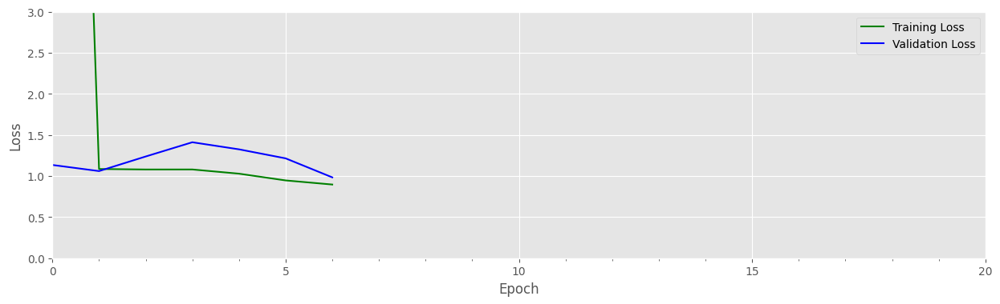

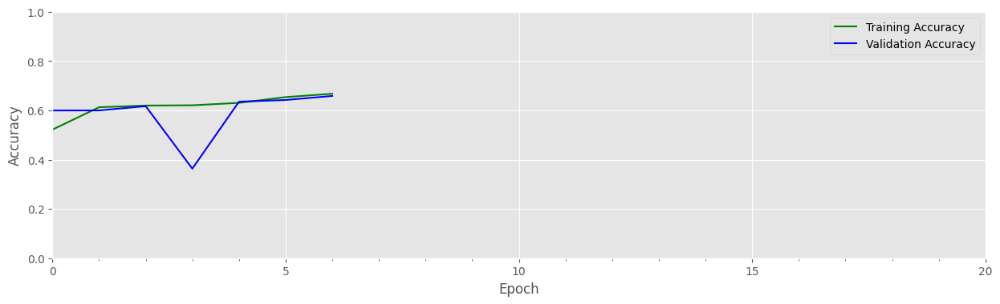

In [ ]:
train_loss = hist["loss"]
train_acc  = hist["accuracy"]
valid_loss = hist["val_loss"]
valid_acc  = hist["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0, 3],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
from sklearn.metrics import accuracy_score
trainacc1 = train_acc[-1]
testacc1 = accuracy_score(label_list, prediction_list)
print(trainacc1)
print(testacc1)

0.6672638055923359
0.6709511568123393


### Визуализация

In [ ]:
!pip install torchviz

  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━

In [ ]:
from torchviz import make_dot
img = Image.open("/content/cassava-leaf-disease-classification/test_images/2216849948.jpg")
transform_vis = transforms.Compose([
    transforms.ToTensor(),
])

img = transform_vis(img)
img = img.to(device = DEVICE)
img.shape
l = [module for module in model1.modules() if not isinstance(module, nn.Sequential)]

conv1 = l[0].layer1[0]
print('First convolution Layer :',conv1)
y = conv1(img)
print('Output Shape :',y.shape)


First convolution Layer : Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Output Shape : torch.Size([16, 600, 800])


In [ ]:
weights = torch.Tensor.cpu(conv1.weight.detach()).numpy()
weights.shape

(16, 3, 5, 5)

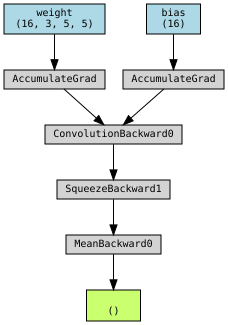

In [ ]:
make_dot(y.mean(), params=dict(conv1.named_parameters()))

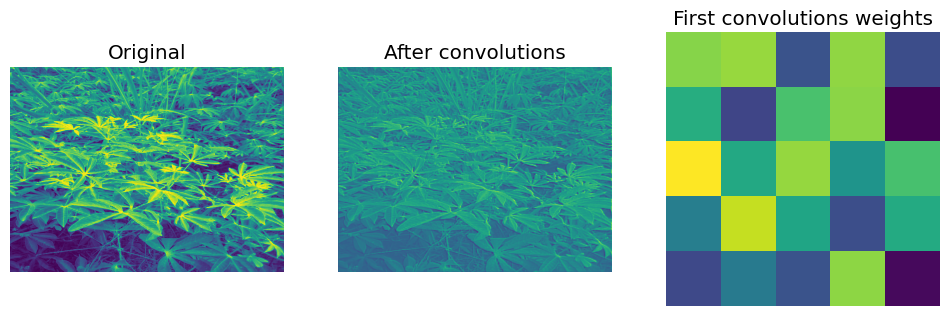

In [ ]:
from torch.autograd import Variable
plt.figure(figsize =(12,5))
plt.subplot(1,3,1)
plt.imshow(torch.Tensor.cpu(img[0].detach()))
plt.title('Original')
plt.axis('off')
img = Variable(img.unsqueeze(0), requires_grad=True)
img_conv1 = torch.Tensor.cpu(y.detach()).numpy()
img_conv1 = np.squeeze(img_conv1)
plt.subplot(1,3,2)
plt.imshow(img_conv1[0])
plt.axis('off')
plt.title('After convolutions')
weights = np.squeeze(weights)
plt.subplot(1,3,3)
plt.imshow(weights[0,0,:,:])
plt.axis('off')
plt.title('First convolutions weights')
plt.show()

## Обучение SGD

In [ ]:
model2 = ConvNet(num_classes=5)
model2.to(DEVICE)
summary(model2)

Layer (type:depth-idx)                   Param #
ConvNet                                  --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,216
│    └─BatchNorm2d: 2-2                  32
│    └─ReLU: 2-3                         --
│    └─MaxPool2d: 2-4                    --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-5                       12,832
│    └─BatchNorm2d: 2-6                  64
│    └─ReLU: 2-7                         --
│    └─MaxPool2d: 2-8                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-9                       51,264
│    └─BatchNorm2d: 2-10                 128
│    └─ReLU: 2-11                        --
│    └─MaxPool2d: 2-12                   --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-13                      204,928
│    └─BatchNorm2d: 2-14                 256
│    └─ReLU: 2-15                        --
│    └─MaxPool2d: 2-16                   --
├─Linear:

In [ ]:
num_epochs = 10
patience = 3
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model2.parameters(), lr=0.001)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1, eta_min=1e-6, last_epoch=-1)

In [ ]:
best_model2, hist = train(model2, num_epochs, no_aug_train_dl, no_aug_val_dl, sch = False)

100%|██████████| 402/402 [04:06<00:00,  1.63it/s]


Epoch 1:   Train accuracy: 0.5692    Validation accuracy: 0.6146 


100%|██████████| 402/402 [04:00<00:00,  1.67it/s]


Epoch 2:   Train accuracy: 0.6404    Validation accuracy: 0.3424 


100%|██████████| 402/402 [03:57<00:00,  1.70it/s]


Epoch 3:   Train accuracy: 0.6666    Validation accuracy: 0.6265 


100%|██████████| 402/402 [03:58<00:00,  1.69it/s]


Epoch 4:   Train accuracy: 0.6875    Validation accuracy: 0.6350 


100%|██████████| 402/402 [03:58<00:00,  1.68it/s]


Epoch 5:   Train accuracy: 0.7097    Validation accuracy: 0.6172 


100%|██████████| 402/402 [03:57<00:00,  1.69it/s]


Epoch 6:   Train accuracy: 0.7328    Validation accuracy: 0.1972 


100%|██████████| 402/402 [03:59<00:00,  1.68it/s]


Epoch 7:   Train accuracy: 0.7502    Validation accuracy: 0.6200 


100%|██████████| 402/402 [04:00<00:00,  1.67it/s]


Epoch 8:   Train accuracy: 0.7763    Validation accuracy: 0.5233 


100%|██████████| 402/402 [03:59<00:00,  1.68it/s]


Epoch 9:   Train accuracy: 0.7947    Validation accuracy: 0.1788 


100%|██████████| 402/402 [03:59<00:00,  1.68it/s]


Epoch 10:   Train accuracy: 0.8250    Validation accuracy: 0.6389 


In [ ]:
label_list = []
prediction_list = []

with torch.no_grad():
    for image, label in tqdm(no_aug_test_dl):

        image = image.to(DEVICE)
        logits = best_model2(image)
        probs = torch.nn.functional.softmax(logits, dim=1).detach().cpu().numpy()
        prediction = np.argmax(probs, axis=1)
        label_list += label.numpy().tolist()
        prediction_list += prediction.tolist()

100%|██████████| 134/134 [01:12<00:00,  1.86it/s]


### График обучения

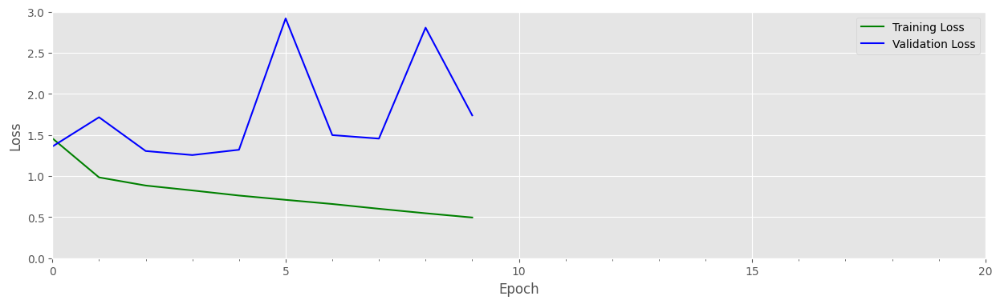

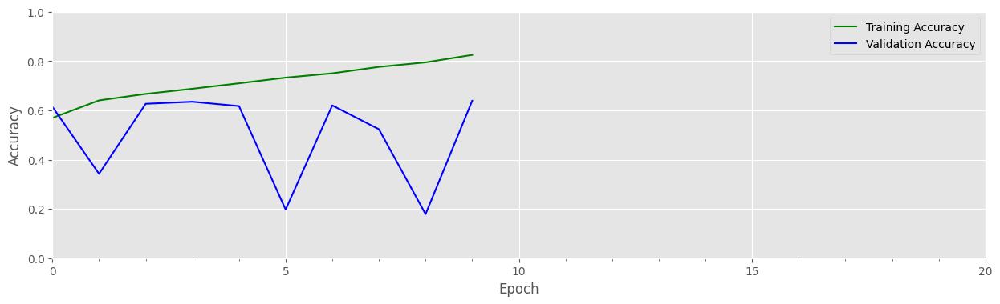

In [ ]:
train_loss = hist["loss"]
train_acc  = hist["accuracy"]
valid_loss = hist["val_loss"]
valid_acc  = hist["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0, 3],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
from sklearn.metrics import accuracy_score
trainacc2 = train_acc[-1]
testacc2 = accuracy_score(label_list, prediction_list)
print(trainacc2)
print(testacc2)


0.8249863696549575
0.6452442159383034


### Визуализация

In [ ]:
!pip install torchviz

  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━

In [ ]:
from torchviz import make_dot
img = Image.open("/content/cassava-leaf-disease-classification/test_images/2216849948.jpg")
transform_vis = transforms.Compose([
    transforms.ToTensor(),
])

img = transform_vis(img)
img = img.to(device = DEVICE)
img.shape
l = [module for module in model2.modules() if not isinstance(module, nn.Sequential)]

conv1 = l[0].layer1[0]
print('First convolution Layer :',conv1)
y = conv1(img)
print('Output Shape :',y.shape)


First convolution Layer : Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Output Shape : torch.Size([16, 600, 800])


In [ ]:
weights = torch.Tensor.cpu(conv1.weight.detach()).numpy()
weights.shape

(16, 3, 5, 5)

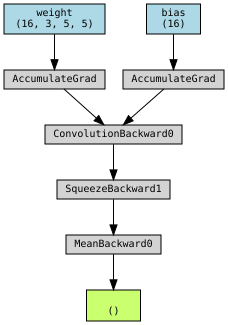

In [ ]:
make_dot(y.mean(), params=dict(conv1.named_parameters()))

In [ ]:
img

tensor([[[0.5098, 0.5216, 0.5804,  ..., 0.6157, 0.4000, 0.2667],
         [0.5569, 0.5412, 0.5529,  ..., 0.6235, 0.4353, 0.3059],
         [0.5412, 0.5137, 0.4980,  ..., 0.6980, 0.6196, 0.5608],
         ...,
         [0.1216, 0.1255, 0.1333,  ..., 0.1059, 0.1176, 0.1255],
         [0.0824, 0.0902, 0.0980,  ..., 0.0706, 0.0784, 0.0863],
         [0.0588, 0.0667, 0.0745,  ..., 0.0824, 0.0824, 0.0824]],

        [[0.4902, 0.5216, 0.5961,  ..., 0.7294, 0.5020, 0.3647],
         [0.5373, 0.5373, 0.5725,  ..., 0.7333, 0.5255, 0.3922],
         [0.5294, 0.5176, 0.5137,  ..., 0.7882, 0.6902, 0.6275],
         ...,
         [0.1961, 0.2000, 0.2078,  ..., 0.0706, 0.0824, 0.0902],
         [0.1647, 0.1725, 0.1804,  ..., 0.0353, 0.0431, 0.0510],
         [0.1412, 0.1490, 0.1569,  ..., 0.0471, 0.0471, 0.0471]],

        [[0.4039, 0.4275, 0.4980,  ..., 0.5020, 0.3176, 0.2078],
         [0.4588, 0.4549, 0.4824,  ..., 0.5059, 0.3529, 0.2392],
         [0.4706, 0.4549, 0.4471,  ..., 0.5765, 0.5255, 0.

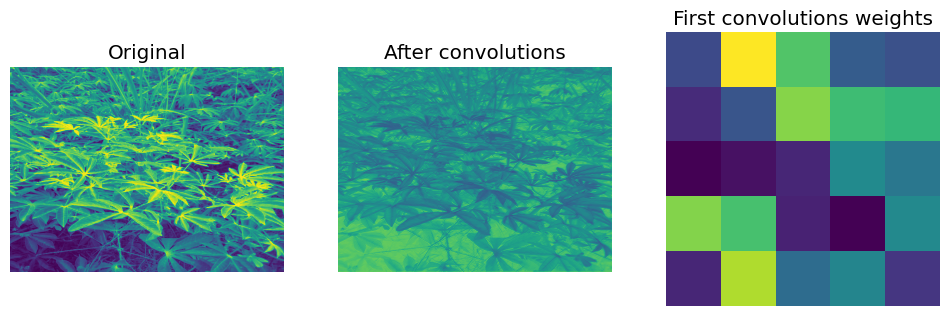

In [ ]:
from torch.autograd import Variable
plt.figure(figsize =(12,5))
plt.subplot(1,3,1)
#plt.imshow(np.transpose(torch.Tensor.cpu(img[0].detach()).numpy().squeeze(),(1, 2, 0)),cmap = 'gray')

plt.imshow(torch.Tensor.cpu(img[0]))

plt.title('Original')
plt.axis('off')
img = Variable(img.unsqueeze(0), requires_grad=True)
img_conv1 = torch.Tensor.cpu(y.detach()).numpy()
img_conv1 = np.squeeze(img_conv1)
plt.subplot(1,3,2)
plt.imshow(img_conv1[0])
plt.axis('off')
plt.title('After convolutions')
weights = np.squeeze(weights)
plt.subplot(1,3,3)
plt.imshow(weights[0,0,:,:])
plt.axis('off')
plt.title('First convolutions weights')
plt.show()

## Обучение SGD + image augmentation

In [ ]:
model3 = ConvNet(num_classes=5)
model3.to(DEVICE)
summary(model3)

Layer (type:depth-idx)                   Param #
ConvNet                                  --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,216
│    └─BatchNorm2d: 2-2                  32
│    └─ReLU: 2-3                         --
│    └─MaxPool2d: 2-4                    --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-5                       12,832
│    └─BatchNorm2d: 2-6                  64
│    └─ReLU: 2-7                         --
│    └─MaxPool2d: 2-8                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-9                       51,264
│    └─BatchNorm2d: 2-10                 128
│    └─ReLU: 2-11                        --
│    └─MaxPool2d: 2-12                   --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-13                      204,928
│    └─BatchNorm2d: 2-14                 256
│    └─ReLU: 2-15                        --
│    └─MaxPool2d: 2-16                   --
├─Linear:

In [ ]:
num_epochs = 7
patience = 1
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model3.parameters(), lr=0.001)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1, eta_min=1e-6, last_epoch=-1)


In [ ]:
best_model3, hist = train(model3, num_epochs, no_aug_train_dl, no_aug_val_dl, sch = False)

100%|██████████| 402/402 [04:19<00:00,  1.55it/s]


Epoch 1:   Train accuracy: 0.5689    Validation accuracy: 0.6284 


100%|██████████| 402/402 [04:21<00:00,  1.54it/s]


Epoch 2:   Train accuracy: 0.6388    Validation accuracy: 0.4515 


100%|██████████| 402/402 [04:19<00:00,  1.55it/s]


Epoch 3:   Train accuracy: 0.6609    Validation accuracy: 0.5779 


100%|██████████| 402/402 [04:22<00:00,  1.53it/s]


Epoch 4:   Train accuracy: 0.6841    Validation accuracy: 0.3704 


100%|██████████| 402/402 [04:23<00:00,  1.53it/s]


Epoch 5:   Train accuracy: 0.7100    Validation accuracy: 0.2339 


100%|██████████| 402/402 [04:20<00:00,  1.54it/s]


Epoch 6:   Train accuracy: 0.7282    Validation accuracy: 0.5382 


100%|██████████| 402/402 [04:17<00:00,  1.56it/s]


Epoch 7:   Train accuracy: 0.7498    Validation accuracy: 0.4216 


In [ ]:
label_list = []
prediction_list = []

with torch.no_grad():
    for image, label in tqdm(test_dl):

        image = image.to(DEVICE)
        logits = best_model3(image)
        probs = torch.nn.functional.softmax(logits, dim=1).detach().cpu().numpy()
        prediction = np.argmax(probs, axis=1)
        label_list += label.numpy().tolist()
        prediction_list += prediction.tolist()

100%|██████████| 134/134 [01:09<00:00,  1.94it/s]


### График обучения

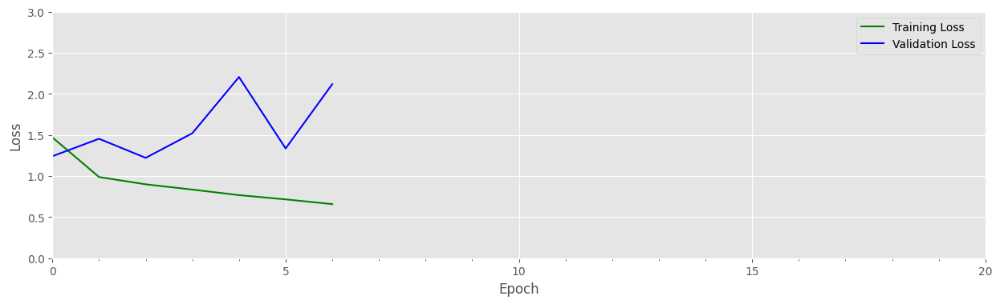

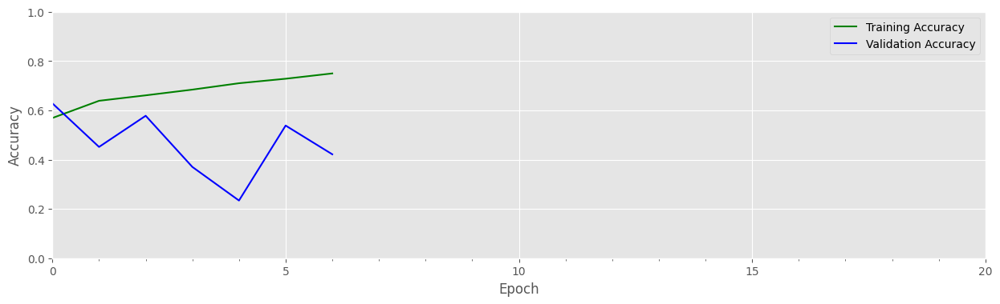

In [ ]:
train_loss = hist["loss"]
train_acc  = hist["accuracy"]
valid_loss = hist["val_loss"]
valid_acc  = hist["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0, 3],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
from sklearn.metrics import accuracy_score
trainacc3 = train_acc[-1]
testacc3 = accuracy_score(label_list, prediction_list)
print(trainacc3)
print(testacc3)

0.7498247527065971
0.6375321336760925


### Визуализация

In [ ]:
!pip install torchviz

In [ ]:
from torchviz import make_dot
img = Image.open("/content/cassava-leaf-disease-classification/test_images/2216849948.jpg")
transform_vis = transforms.Compose([
    transforms.ToTensor(),
])

img = transform_vis(img)
img = img.to(device = DEVICE)
img.shape
l = [module for module in model3.modules() if not isinstance(module, nn.Sequential)]

conv1 = l[0].layer1[0]
print('First convolution Layer :',conv1)
y = conv1(img)
print('Output Shape :',y.shape)


First convolution Layer : Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Output Shape : torch.Size([16, 600, 800])


In [ ]:
weights = torch.Tensor.cpu(conv1.weight.detach()).numpy()
weights.shape

(16, 3, 5, 5)

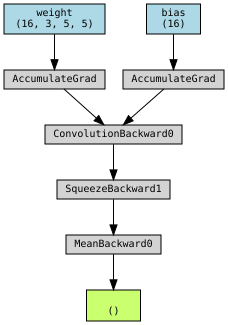

In [ ]:
make_dot(y.mean(), params=dict(conv1.named_parameters()))

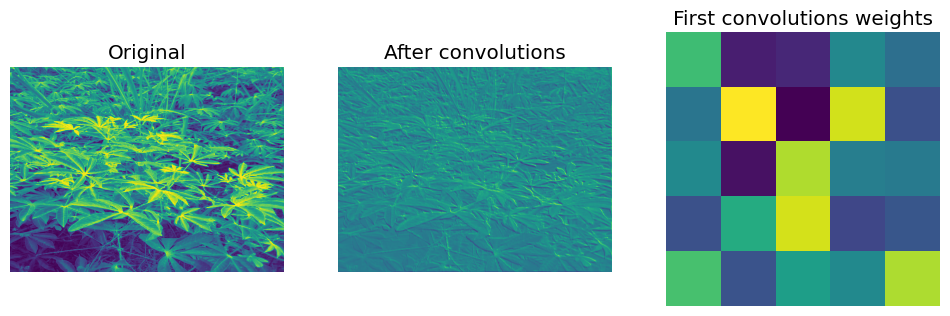

In [ ]:
from torch.autograd import Variable
plt.figure(figsize =(12,5))
plt.subplot(1,3,1)
plt.imshow(torch.Tensor.cpu(img[0]))
plt.title('Original')
plt.axis('off')
img = Variable(img.unsqueeze(0), requires_grad=True)
img_conv1 = torch.Tensor.cpu(y.detach()).numpy()
img_conv1 = np.squeeze(img_conv1)
plt.subplot(1,3,2)
plt.imshow(img_conv1[0] )
plt.axis('off')
plt.title('After convolutions')
weights = np.squeeze(weights)
plt.subplot(1,3,3)
plt.imshow(weights[0,0,:,:])
plt.axis('off')
plt.title('First convolutions weights')
plt.show()

## Обучение ResNet + Adam

In [ ]:
def get_resnet_model():

    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

    for params in model.parameters():
        params.requires_grad = False

    in_feat = model.fc.in_features

    model.fc = nn.Sequential(
          nn.Linear(in_feat, 256),
          nn.ReLU(),
          nn.Dropout(p=0.3),
          nn.Linear(256, NUM_CLASSES))

    model = model.to(DEVICE)

    return model

In [ ]:
model4 = get_resnet_model()

summary(model4, input_size=(BATCH_SIZE, 3, WIDTH, HEIGHT))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 5]                   --
├─Conv2d: 1-1                            [32, 64, 256, 256]        (9,408)
├─BatchNorm2d: 1-2                       [32, 64, 256, 256]        (128)
├─ReLU: 1-3                              [32, 64, 256, 256]        --
├─MaxPool2d: 1-4                         [32, 64, 128, 128]        --
├─Sequential: 1-5                        [32, 256, 128, 128]       --
│    └─Bottleneck: 2-1                   [32, 256, 128, 128]       --
│    │    └─Conv2d: 3-1                  [32, 64, 128, 128]        (4,096)
│    │    └─BatchNorm2d: 3-2             [32, 64, 128, 128]        (128)
│    │    └─ReLU: 3-3                    [32, 64, 128, 128]        --
│    │    └─Conv2d: 3-4                  [32, 64, 128, 128]        (36,864)
│    │    └─BatchNorm2d: 3-5             [32, 64, 128, 128]        (128)
│    │    └─ReLU: 3-6                    [32, 64, 128, 128] 

In [ ]:
num_epochs = 7
patience = 2
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model4.parameters(), lr=0.001)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1, eta_min=1e-6, last_epoch=-1)

In [ ]:
best_model4, hist = train(model4, num_epochs, train_dl, val_dl)

100%|██████████| 402/402 [06:42<00:00,  1.00s/it]


Epoch 1:   Train accuracy: 0.6983    Validation accuracy: 0.7443 


100%|██████████| 402/402 [06:41<00:00,  1.00it/s]


Epoch 2:   Train accuracy: 0.7441    Validation accuracy: 0.7747 


100%|██████████| 402/402 [06:46<00:00,  1.01s/it]


Epoch 3:   Train accuracy: 0.7605    Validation accuracy: 0.7698 


100%|██████████| 402/402 [06:43<00:00,  1.00s/it]


Epoch 4:   Train accuracy: 0.7681    Validation accuracy: 0.7794 


100%|██████████| 402/402 [06:39<00:00,  1.01it/s]


Epoch 5:   Train accuracy: 0.7690    Validation accuracy: 0.7918 


100%|██████████| 402/402 [06:40<00:00,  1.00it/s]


Epoch 6:   Train accuracy: 0.7764    Validation accuracy: 0.8002 


100%|██████████| 402/402 [06:40<00:00,  1.00it/s]


Epoch 7:   Train accuracy: 0.7807    Validation accuracy: 0.7929 


### График обучения

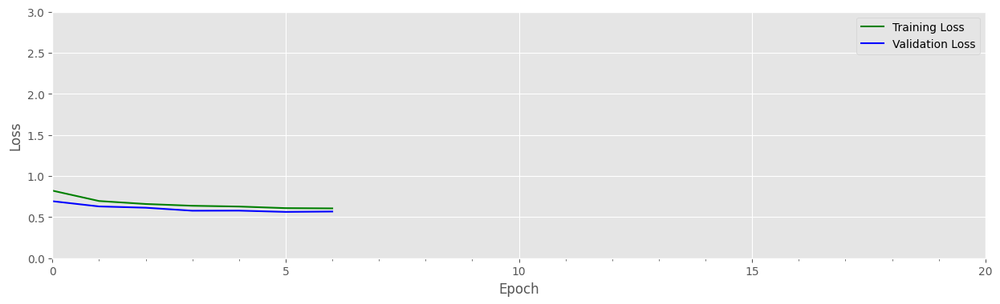

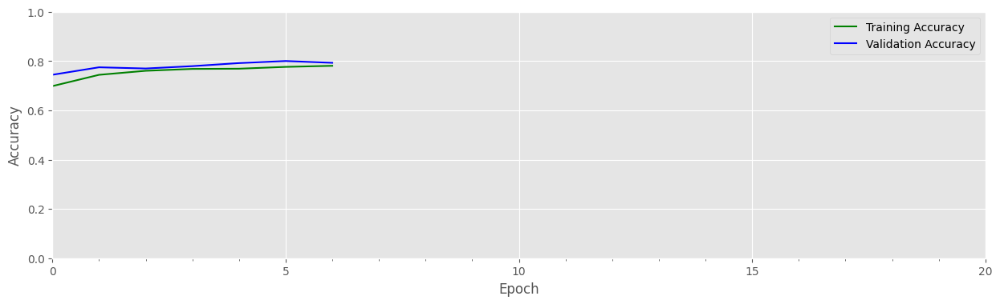

In [ ]:
train_loss = hist["loss"]
train_acc  = hist["accuracy"]
valid_loss = hist["val_loss"]
valid_acc  = hist["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0, 3],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
from sklearn.metrics import accuracy_score
trainacc4 = train_acc[-1]
testacc4 = accuracy_score(label_list, prediction_list)
print(trainacc4)
print(testacc4)

0.7945362474373461
0.7886456743524337


## Обучение Adam

In [ ]:
model5 = ConvNet(num_classes=5)
model5.to(DEVICE)
summary(model5)

Layer (type:depth-idx)                   Param #
ConvNet                                  --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,216
│    └─BatchNorm2d: 2-2                  32
│    └─ReLU: 2-3                         --
│    └─MaxPool2d: 2-4                    --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-5                       12,832
│    └─BatchNorm2d: 2-6                  64
│    └─ReLU: 2-7                         --
│    └─MaxPool2d: 2-8                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-9                       51,264
│    └─BatchNorm2d: 2-10                 128
│    └─ReLU: 2-11                        --
│    └─MaxPool2d: 2-12                   --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-13                      204,928
│    └─BatchNorm2d: 2-14                 256
│    └─ReLU: 2-15                        --
│    └─MaxPool2d: 2-16                   --
├─Linear:

In [ ]:
num_epochs = 3
patience = 2
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model5.parameters(), lr=0.001)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1, eta_min=1e-6, last_epoch=-1)


In [ ]:
best_model5, hist = train(model5, num_epochs, no_aug_train_dl, no_aug_val_dl, sch = False)

100%|██████████| 402/402 [05:08<00:00,  1.30it/s]


Epoch 1:   Train accuracy: 0.5232    Validation accuracy: 0.5941 


100%|██████████| 402/402 [04:40<00:00,  1.43it/s]


Epoch 2:   Train accuracy: 0.6011    Validation accuracy: 0.6160 


100%|██████████| 402/402 [04:40<00:00,  1.43it/s]


Epoch 3:   Train accuracy: 0.6155    Validation accuracy: 0.6167 


In [ ]:
label_list = []
prediction_list = []

with torch.no_grad():
    for image, label in tqdm(no_aug_test_dl):

        image = image.to(DEVICE)
        logits = best_model5(image)
        probs = torch.nn.functional.softmax(logits, dim=1).detach().cpu().numpy()
        prediction = np.argmax(probs, axis=1)
        label_list += label.numpy().tolist()
        prediction_list += prediction.tolist()

100%|██████████| 134/134 [01:08<00:00,  1.95it/s]


### График обучения

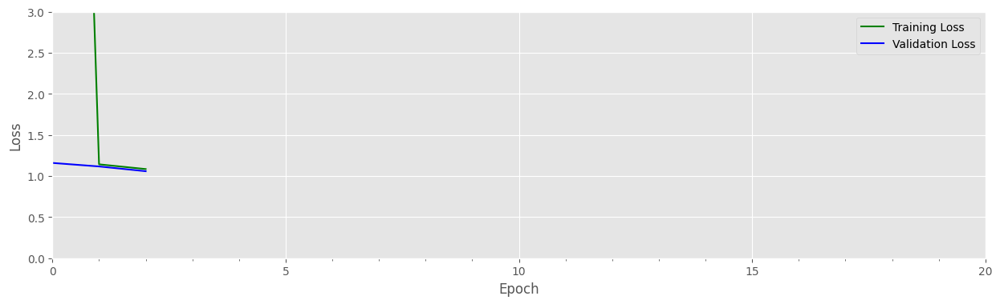

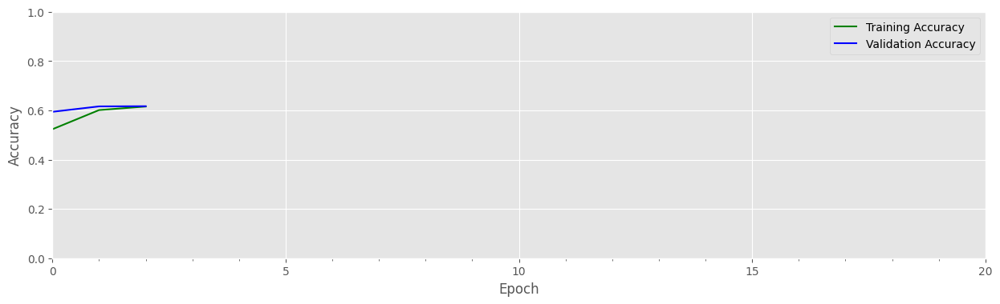

In [ ]:
train_loss = hist["loss"]
train_acc  = hist["accuracy"]
valid_loss = hist["val_loss"]
valid_acc  = hist["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0, 3],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
from sklearn.metrics import accuracy_score
trainacc5 = train_acc[-1]
testacc5 = accuracy_score(label_list, prediction_list)
print(trainacc5)
print(testacc5)

0.6155463821169873
0.625146062164057


### Визуализация

In [ ]:
!pip install torchviz

  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━

In [ ]:
from torchviz import make_dot
img = Image.open("/content/cassava-leaf-disease-classification/test_images/2216849948.jpg")
transform_vis = transforms.Compose([
    transforms.ToTensor(),
])

img = transform_vis(img)
img = img.to(device = DEVICE)
img.shape
l = [module for module in model5.modules() if not isinstance(module, nn.Sequential)]

conv1 = l[0].layer1[0]
print('First convolution Layer :',conv1)
y = conv1(img)
print('Output Shape :',y.shape)


First convolution Layer : Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Output Shape : torch.Size([16, 600, 800])


In [ ]:
weights = torch.Tensor.cpu(conv1.weight.detach()).numpy()
weights.shape

(16, 3, 5, 5)

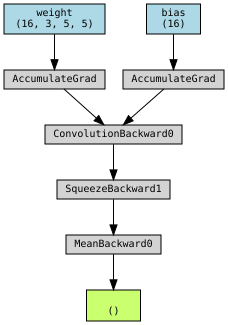

In [ ]:
make_dot(y.mean(), params=dict(conv1.named_parameters()))

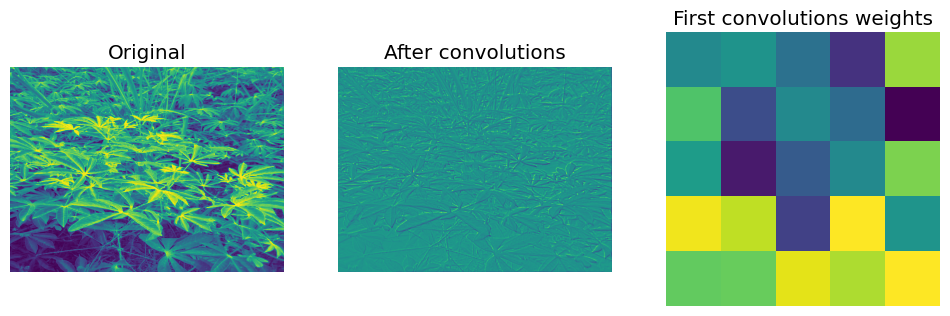

In [ ]:
from torch.autograd import Variable
plt.figure(figsize =(12,5))
plt.subplot(1,3,1)
plt.imshow(torch.Tensor.cpu(img[0].detach()))
plt.title('Original')
plt.axis('off')
img = Variable(img.unsqueeze(0), requires_grad=True)
img_conv1 = torch.Tensor.cpu(y.detach()).numpy()
img_conv1 = np.squeeze(img_conv1)
plt.subplot(1,3,2)
plt.imshow(img_conv1[0])
plt.axis('off')
plt.title('After convolutions')
weights = np.squeeze(weights)
plt.subplot(1,3,3)
plt.imshow(weights[0,0,:,:])
plt.axis('off')
plt.title('First convolutions weights')
plt.show()

## Сравнение результатов

In [ ]:
import pandas as pd
d = {'models': ['Adam + lr scheduler', 'SGD', 'SGD + image aug', 'ResNet + Adam', 'Adam'],
     'train accuracy': [trainacc1, trainacc2, trainacc3, trainacc4, trainacc5],
     'test accuracy': [testacc1, testacc2, testacc3, testacc4, testacc5]}
df = pd.DataFrame(data=d, index=[0, 1, 2, 3, 4])

In [ ]:
df

,models,train accuracy,test accuracy
0,Adam + lr scheduler,0.667264,0.670951
1,SGD,0.824986,0.645244
2,SGD + image aug,0.749825,0.637532
3,ResNet + Adam,0.794536,0.788646
4,Adam,0.615546,0.625146


# 2 Задание

In [ ]:
import pandas as pd
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import json

from imblearn.under_sampling import RandomUnderSampler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import os
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, f1_score, accuracy_score

import prettytable

import warnings
warnings.filterwarnings('ignore')

In [ ]:
!gdown --id "1tzMsebyES7P7qcZP99-Xh64-Vgsdc7Qt"

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1tzMsebyES7P7qcZP99-Xh64-Vgsdc7Qt
From (redirected): https://drive.google.com/uc?id=1tzMsebyES7P7qcZP99-Xh64-Vgsdc7Qt&confirm=t&uuid=c115d665-7729-42db-99f6-192579d3d487
To: /content/archive.zip
100% 4.17G/4.17G [03:01<00:00, 22.9MB/s]


In [ ]:
!unzip "/content/archive.zip" -d "/content/archive/"

Archive:  /content/archive.zip
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/000.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/001.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/002.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/003.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/004.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/005.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/006.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/008.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/011.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/013.png  
  inflating: /content/archive/RGB_color_image_masks/RGB_color_image_masks/014.png  
  inflating: /content/archive/RGB_color_image

In [ ]:
images_path = '/content/archive/dataset/semantic_drone_dataset/original_images'
masks_path = '/content/archive/dataset/semantic_drone_dataset/label_images_semantic'

colors = dict(list(map(lambda x: (x[0], (x[1], x[2], x[3])), pd.read_csv('/content/archive/class_dict_seg.csv').values)))
colors

{'unlabeled': (0, 0, 0),
 'paved-area': (128, 64, 128),
 'dirt': (130, 76, 0),
 'grass': (0, 102, 0),
 'gravel': (112, 103, 87),
 'water': (28, 42, 168),
 'rocks': (48, 41, 30),
 'pool': (0, 50, 89),
 'vegetation': (107, 142, 35),
 'roof': (70, 70, 70),
 'wall': (102, 102, 156),
 'window': (254, 228, 12),
 'door': (254, 148, 12),
 'fence': (190, 153, 153),
 'fence-pole': (153, 153, 153),
 'person': (255, 22, 96),
 'dog': (102, 51, 0),
 'car': (9, 143, 150),
 'bicycle': (119, 11, 32),
 'tree': (51, 51, 0),
 'bald-tree': (190, 250, 190),
 'ar-marker': (112, 150, 146),
 'obstacle': (2, 135, 115),
 'conflicting': (255, 0, 0)}

In [ ]:
classes = list(colors.keys())

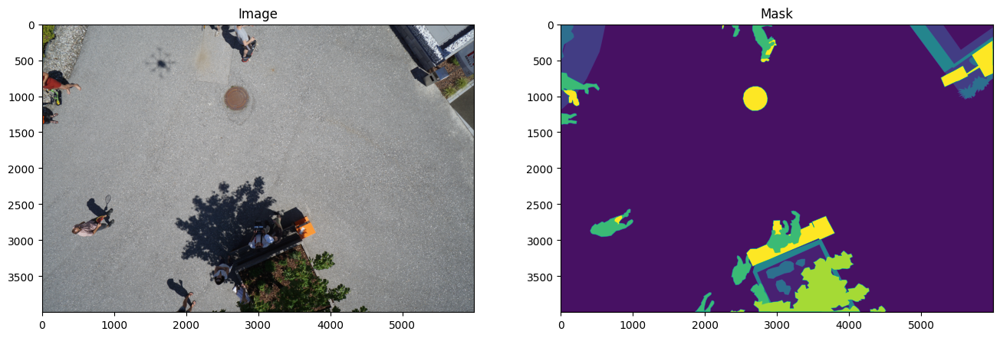

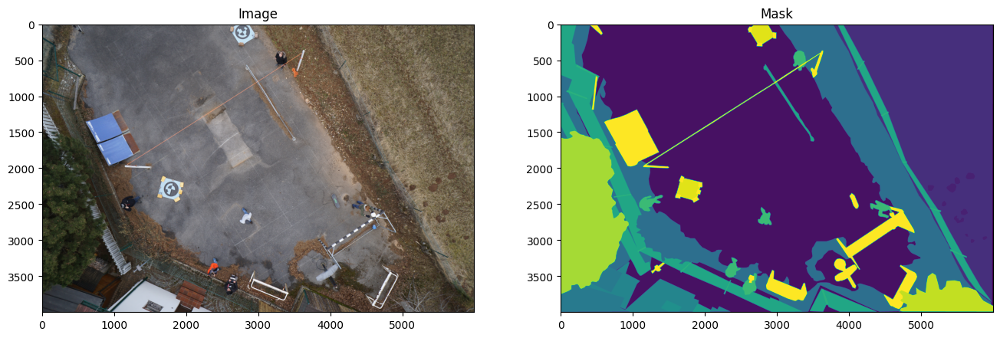

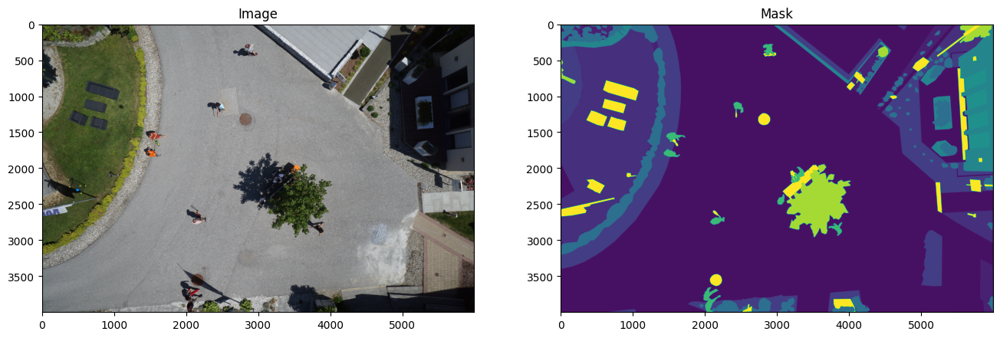

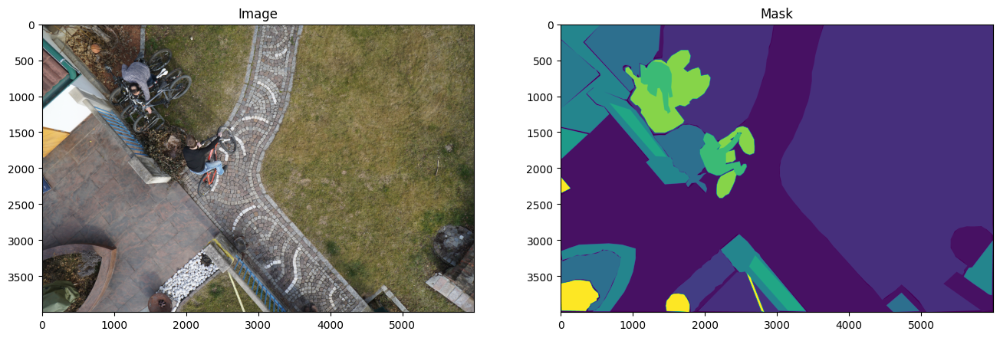

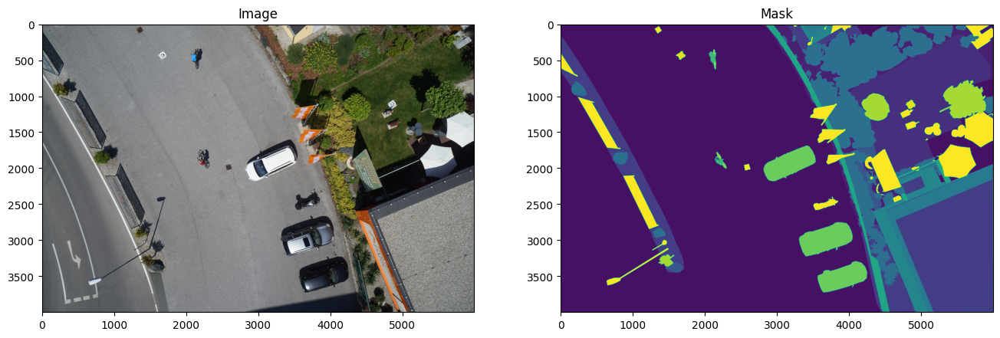

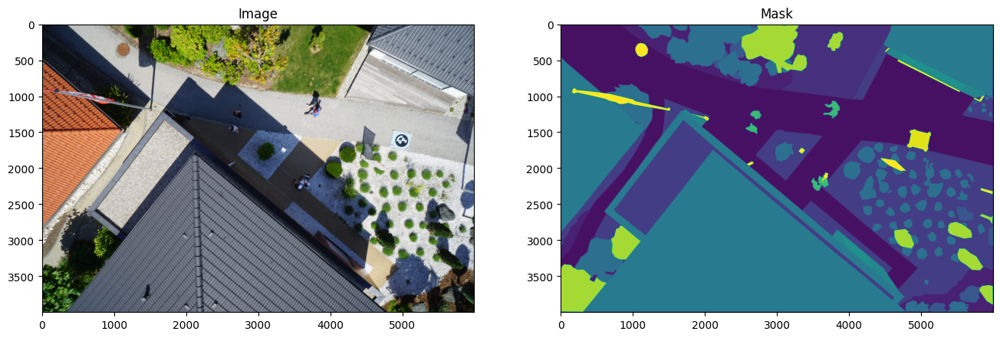

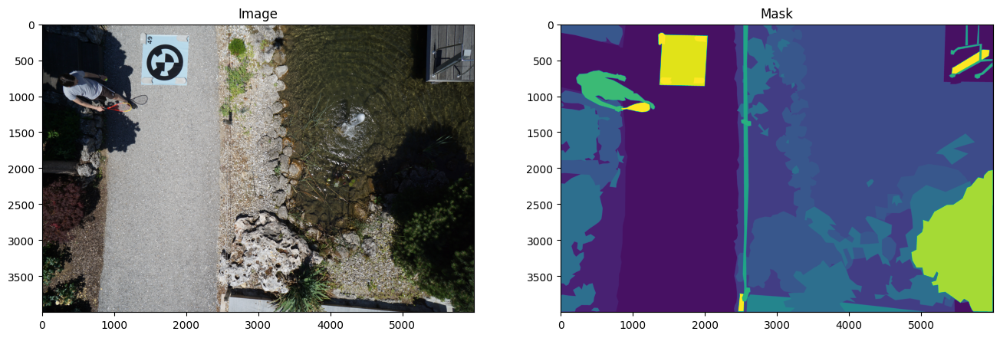

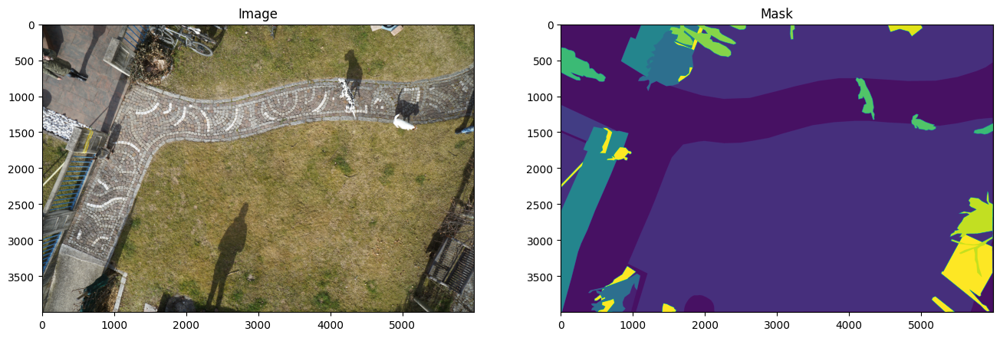

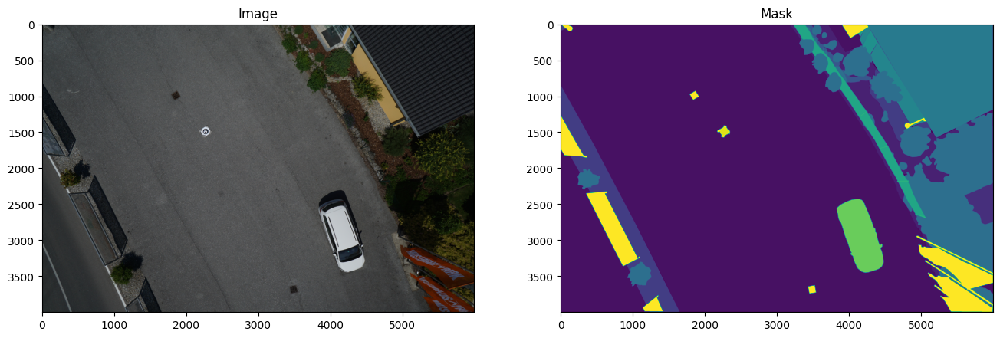

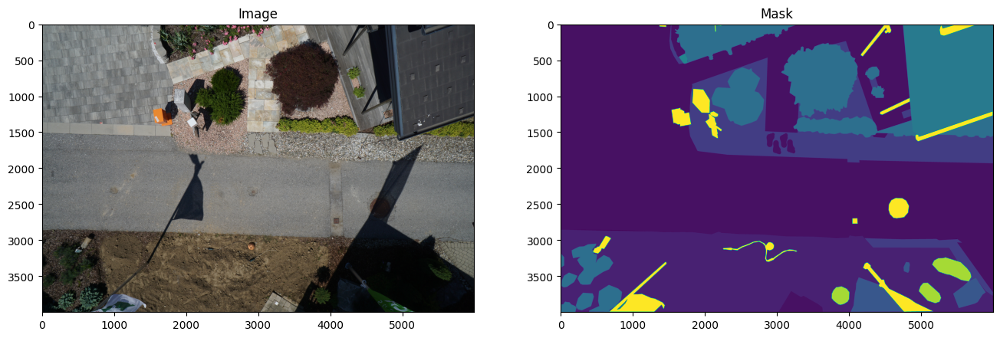

In [ ]:
img_files = sorted(os.listdir(images_path))
mask_files = sorted(os.listdir(masks_path))

for i in range(10):
    img_file = img_files[i]
    mask_file = mask_files[i]

    image = read_image(os.path.join(images_path, img_file))
    mask = read_image(os.path.join(masks_path, mask_file))

    plt.figure(figsize=(16, 8))
    plt.subplot(121)
    plt.title("Image")
    plt.imshow(image.permute(1, 2, 0))
    plt.subplot(122)
    plt.title("Mask")
    plt.imshow(mask.permute(1, 2, 0))
    plt.show()


In [ ]:
class SegDataset(Dataset):
    def __init__(self, path_images, path_segs, image_transform, mask_transform, label_colors_list, classes):

        self.path_images = path_images
        self.path_segs = path_segs
        self.label_colors_list = label_colors_list
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.imgs = list(sorted(os.listdir(path_images)))
        self.masks = list(sorted(os.listdir(path_segs)))

        self.class_values = list(range(len(classes)))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, index):
        image = read_image(os.path.join(self.path_images, self.imgs[index])).to(torch.float)
        mask = read_image(os.path.join(self.path_segs, self.masks[index])).to(torch.long)

        image = self.image_transform(image)
        mask = self.mask_transform(mask).squeeze()

        return image, mask

    def _load_image(self, path):
        image = read_image(path).to(torch.float)
        return self.image_transform(image)

    def _load_mask(self, path):
        mask = read_image(path).to(torch.long)
        return self.mask_transform(mask).squeeze()

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 352), antialias=True),
])

In [ ]:
BATCH_SIZE = 5
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Device: {DEVICE}')

Device: cuda


In [ ]:
train_dataset = SegDataset(images_path, masks_path, transform,
                              transform,
                              list(colors.values()),
                              classes=list(colors.keys()))

train_data_loader = DataLoader(train_dataset, BATCH_SIZE)

In [ ]:
!pip install segmentation_models_pytorch

In [ ]:
imgs_path = '/content/archive/dataset/semantic_drone_dataset/original_images'
masks_path = '/content/archive/dataset/semantic_drone_dataset/label_images_semantic'

In [ ]:
colors = dict(list(map(lambda x: (x[0], (x[1], x[2], x[3])), pd.read_csv('/content/archive/class_dict_seg.csv').values)))
colors

{'unlabeled': (0, 0, 0),
 'paved-area': (128, 64, 128),
 'dirt': (130, 76, 0),
 'grass': (0, 102, 0),
 'gravel': (112, 103, 87),
 'water': (28, 42, 168),
 'rocks': (48, 41, 30),
 'pool': (0, 50, 89),
 'vegetation': (107, 142, 35),
 'roof': (70, 70, 70),
 'wall': (102, 102, 156),
 'window': (254, 228, 12),
 'door': (254, 148, 12),
 'fence': (190, 153, 153),
 'fence-pole': (153, 153, 153),
 'person': (255, 22, 96),
 'dog': (102, 51, 0),
 'car': (9, 143, 150),
 'bicycle': (119, 11, 32),
 'tree': (51, 51, 0),
 'bald-tree': (190, 250, 190),
 'ar-marker': (112, 150, 146),
 'obstacle': (2, 135, 115),
 'conflicting': (255, 0, 0)}

In [ ]:
classes = list(colors.keys())

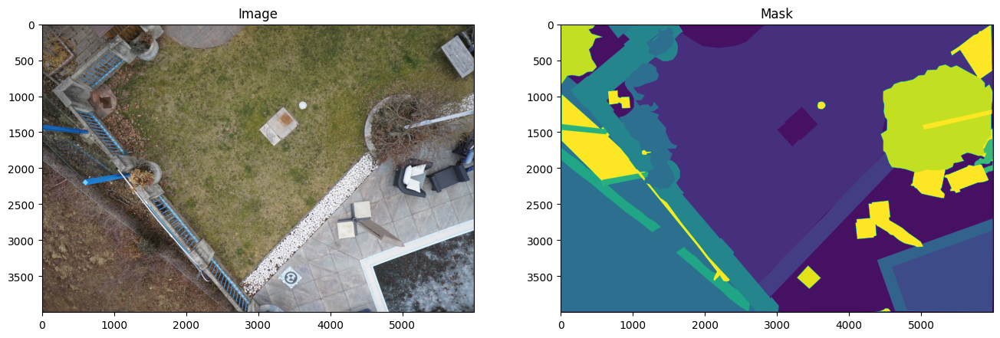

In [ ]:
image = read_image(os.path.join(imgs_path, '208.jpg'))
mask = read_image(os.path.join(masks_path, '208.png'))

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title("Image")
plt.imshow(image.permute(1, 2, 0))
plt.subplot(122)
plt.title("Mask")
plt.imshow(mask.permute(1, 2, 0))

In [ ]:
class SegDataset(Dataset):
    def __init__(self, path_images, path_segs, image_transform, mask_transform, label_colors_list, classes):
        print(f"TRAINING ON CLASSES: {classes}")

        self.path_images = path_images
        self.path_segs = path_segs
        self.label_colors_list = label_colors_list
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.imgs = list(sorted(os.listdir(path_images)))
        self.masks = list(sorted(os.listdir(path_segs)))

        self.class_values = list(range(len(classes)))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, index):
        image = read_image(os.path.join(self.path_images, self.imgs[index])).to(torch.float)
        mask = read_image(os.path.join(self.path_segs, self.masks[index])).to(torch.long)

        image = self.image_transform(image)
        mask = self.mask_transform(mask).squeeze()

        return image, mask

transform = transforms.Compose([
    transforms.Resize((224, 320), antialias=True),
])

train_dataset = SegDataset(imgs_path, masks_path, transform,
                              transform,
                              list(colors.values()),
                              classes=list(colors.keys()))

train_data_loader = DataLoader(train_dataset, batch_size=5)

TRAINING ON CLASSES: ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']


In [ ]:
!pip install segmentation_models_pytorch

In [ ]:
import segmentation_models_pytorch as smp

In [ ]:
from tqdm import tqdm

def train_model(model, train_data_loader, optimizer, criterion, device, n_epoch=15):
    model.train()
    loss_history = []

    for epoch in range(1, n_epoch+1):
        total_loss = 0
        progress_bar = tqdm(train_data_loader, desc=f'Epoch {epoch} of {n_epoch}')

        for x, y in progress_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()

            output = model(x)
            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            avg_loss = total_loss / (epoch * len(train_data_loader))
            progress_bar.set_postfix({'Loss': f'{total_loss:.5f}', 'Avg Loss per batch': f'{avg_loss:.5f}'})

        loss_history.append(avg_loss)

    return loss_history

In [ ]:
def plot_images(dataset, model, device, index):
    image, mask = dataset[index]
    result = model(image.unsqueeze(0).to(device))

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    image = image.permute(1, 2, 0)
    image = (image - image.min()) / (image.max() - image.min())

    axs[0].imshow(image)
    axs[0].set_title('Оригинальное изображение')

    axs[1].imshow(result.squeeze().cpu().argmax(dim=0))
    axs[1].set_title('Предсказанное изображение')

    axs[2].imshow(mask.squeeze().to(torch.uint8))
    axs[2].set_title('Оригинальное изображение с меткой')

    for ax in axs:
        ax.axis('off')

    plt.show()

## FPN architecture

In [ ]:
model_FPN = smp.FPN(
    encoder_name="timm-mobilenetv3_large_minimal_100",
    encoder_weights="imagenet",
    in_channels=3,
    classes=len(classes),
)

model_FPN

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_mobilenetv3_large_minimal_100-8596ae28.pth" to /root/.cache/torch/hub/checkpoints/tf_mobilenetv3_large_minimal_100-8596ae28.pth
100%|██████████| 15.1M/15.1M [00:01<00:00, 8.91MB/s]


FPN(
  (encoder): MobileNetV3Encoder(
    (model): MobileNetV3Features(
      (conv_stem): Conv2dSame(3, 16, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (bn1): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): ReLU(inplace=True)
            )
            (se): Identity()
            (conv_pw): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn2): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): Identity()
            )
  

In [ ]:
for param in model_FPN.parameters():
    param.requires_grad_(False)

for module in [model_FPN.segmentation_head, model_FPN.decoder]:
    for param in module.parameters():
        param.requires_grad_(True)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%%capture

model_FPN.to(DEVICE)

In [ ]:
parameters = [p for p in model_FPN.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(parameters, lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
train_model(model_FPN, train_data_loader, optimizer, criterion, DEVICE, n_epoch=5)

Epoch 5 of 5: 100%|██████████| 80/80 [06:15<00:00,  4.70s/it, Loss=91.65193, Avg Loss per batch=0.22913]


[2.5167339727282525,
 0.796387142688036,
 0.45989663104216255,
 0.3139037018641829,
 0.22912982121109962]

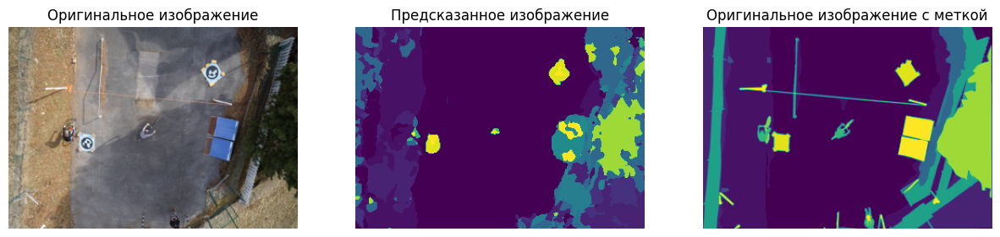

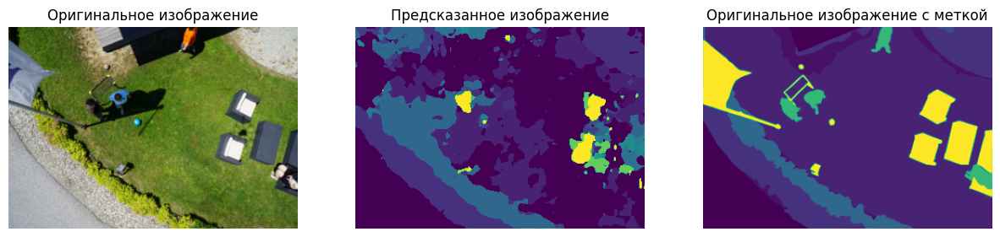

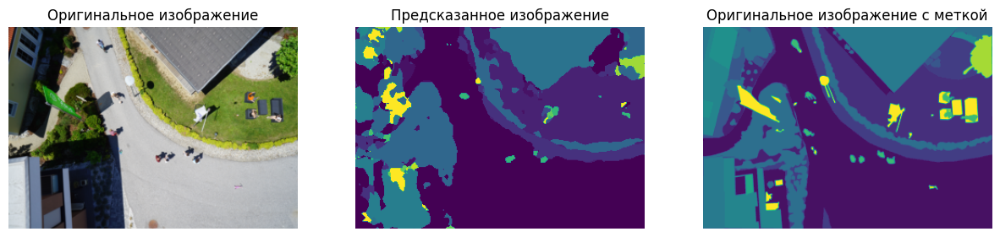

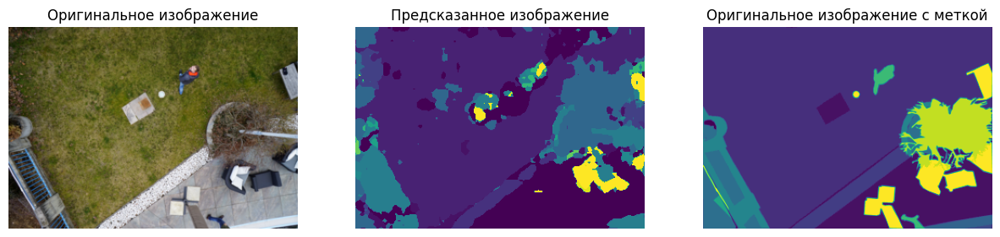

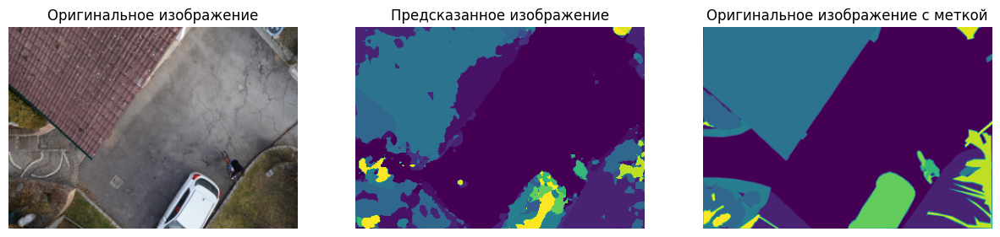

In [ ]:
for num_img in range(10, 51, 10):
  plot_images(train_dataset, model_FPN, DEVICE, num_img)

## Unet architecture

In [ ]:
model_UNET = smp.Unet(
    encoder_name="timm-mobilenetv3_large_minimal_100",
    encoder_weights="imagenet",
    in_channels=3,
    classes=len(classes),
)

model_UNET

Unet(
  (encoder): MobileNetV3Encoder(
    (model): MobileNetV3Features(
      (conv_stem): Conv2dSame(3, 16, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (bn1): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): ReLU(inplace=True)
            )
            (se): Identity()
            (conv_pw): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn2): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): Identity()
            )
 

In [ ]:
for param in model_UNET.parameters():
    param.requires_grad_(False)

for module in [model_UNET.segmentation_head, model_UNET.decoder]:
    for param in module.parameters():
        param.requires_grad_(True)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%%capture

model_UNET.to(DEVICE)

In [ ]:
parameters = [p for p in model_UNET.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(parameters, lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
train_model(model_UNET, train_data_loader, optimizer, criterion, DEVICE, n_epoch=5)

Epoch 5 of 5: 100%|██████████| 80/80 [06:25<00:00,  4.82s/it, Loss=108.85923, Avg Loss per batch=0.27215]


[2.853477102518082,
 1.0594571650028228,
 0.571553819378217,
 0.37549023143947124,
 0.27214808464050294]

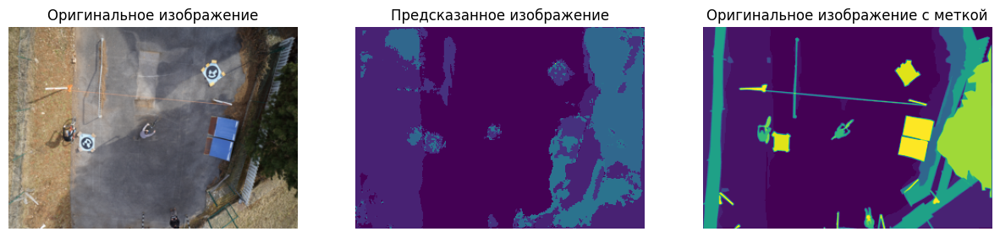

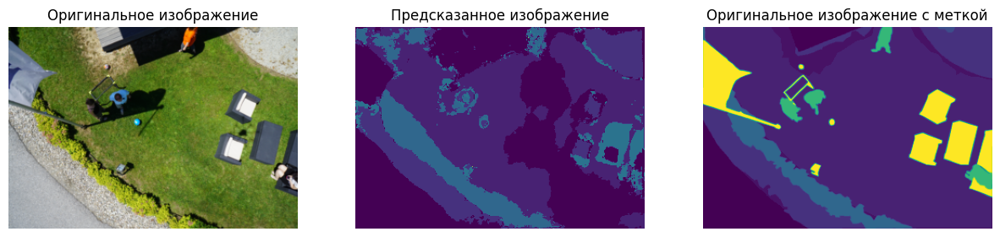

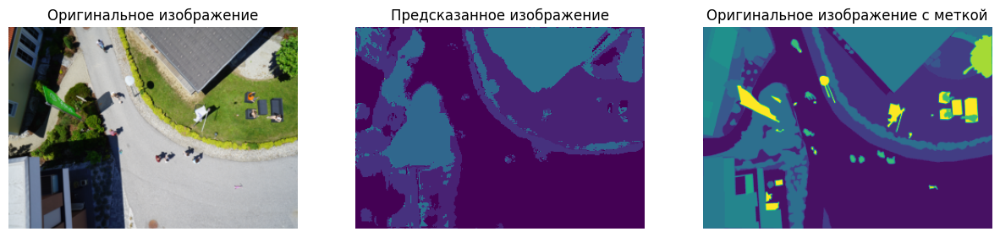

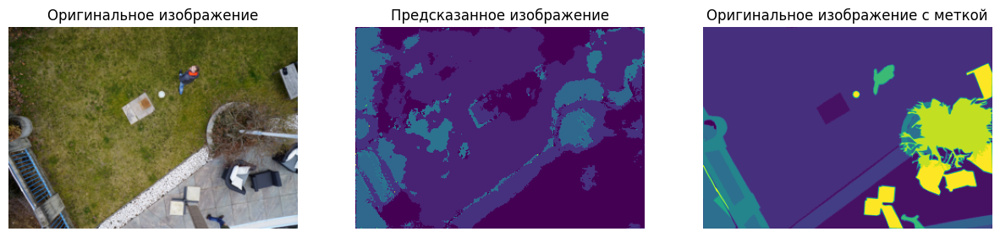

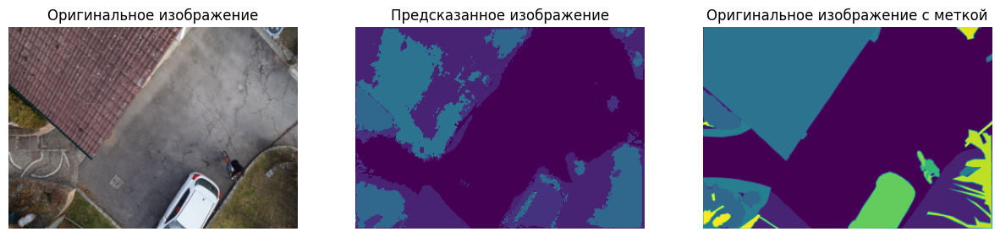

In [ ]:
for num_img in range(10, 51, 10):
  plot_images(train_dataset, model_UNET, DEVICE, num_img)